width = 800
height = 531
identifying pores...
% of pores = 33.734


box size = 200  pores = 2  L = 0.354  D = -0.667
box size = 100  pores = 8  L = 0.158  D = -1.127
box size = 50  pores = 30  L = 0.079  D = -1.340
box size = 25  pores = 159  L = 0.039  D = -1.557
box size = 12  pores = 795  L = 0.019  D = -1.675
box size = 6  pores = 3495  L = 0.009  D = -1.742
box size = 3  pores = 15063  L = 0.005  D = -1.788
box size = 1  pores = 143302  L = 0.002  D = -1.832


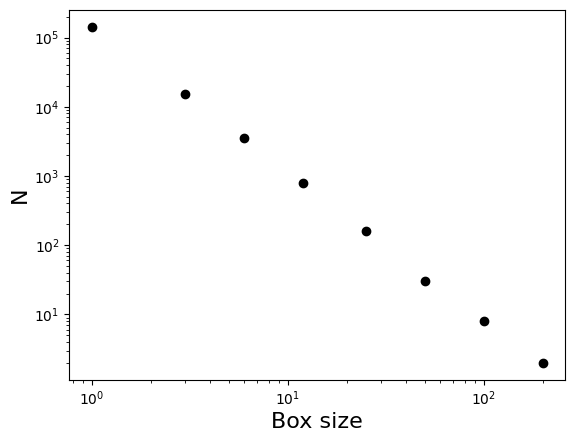

In [ ]:
##Chapter_2.1

import piplite
await piplite.install('matplotlib')
%run PSP_boxCounting.py

In [ ]:
##Chapter_2.2

import math
from math import pi

wt_Cylinder = 45 # in g
d_Cylinder = 8 # in cm
h_Cylinder = 6 # in cm
fWsoil_w_Cylinder = 445 # in g
oDWsoil_w_Cylinder = 375 # in g
dP = 2650 # in kg/m3
dW = 1000 # in kg/m3

#Gravimetric water content (g/g)
#Formula (Mw/Ms) or (FW-ODW)/ODW

gwc = (((fWsoil_w_Cylinder-wt_Cylinder)-(oDWsoil_w_Cylinder-wt_Cylinder))/(oDWsoil_w_Cylinder-wt_Cylinder))

#Dry bulk density (g/cm3)
#Formula (Ms/Vt)

Vt = pi*(d_Cylinder/2)**2 * h_Cylinder
dB = ((oDWsoil_w_Cylinder-wt_Cylinder)/Vt)

#Volumetric water content (cm3/cm3)
#Formula (Vw/Vt) or gwc * (dB/dW)

vwc = (gwc * (dB/(dW/1000)))

#Total porosity (cm3/cm3)
#Formula (Vf/Vt) or 1 - (dB/dP)

f = (1 - (dB/(dP/1000)))

print('gravimetric_water_content (g/g) =', round(gwc, 2)) #rounds the answer to 2 decimal places
print('bulk_density (g/cm3) =', round(dB, 2))
print('volumetric_water_content (cm3/cm3) =', round(vwc, 2))
print('porosity (cm3/cm3) =', round(f, 2))

gravimetric_water_content (g/g) = 0.21
bulk_density (g/cm3) = 1.09
volumetric_water_content (cm3/cm3) = 0.23
porosity (cm3/cm3) = 0.59


In [ ]:
##Chapter_2.3

#Still working...

#Calculating soil physical properties

def computePorosity(bulkDensity, massWetness):
        waterDensity = 1000.
        particleDensity = 2650.
        porosity = 1 - (bulkDensity / particleDensity)
        voidRatio = porosity / (1 - porosity)
        waterContent = massWetness * (bulkDensity / waterDensity)
        gasPorosity = porosity - waterContent
        degreeSaturation = waterContent / porosity
        print ("\nTotal porosity [m^3/m^3] = ", format(porosity, '.3f'))
        print ("Void ratio [m^3/m^3] = ", format(voidRatio, '.3f'))
        print ("Volumetric water content [m^3/m^3] = ", format(waterContent, '.3f'))
        print ("Gas filled porosity [m^3/m^3] = ", format(gasPorosity, '.3f'))
        print ("Degree of saturation [-] =", format(degreeSaturation, '.3f'))
        return

def computeSaturationWetness(bulkDensity):
        waterDensity = 1000
        particleDensity = 2650
        porosity = 1 - (bulkDensity / particleDensity)
        return (porosity / (bulkDensity / waterDensity))

def main():
        bulkDensity = 1094  # in kg/m3
        massWetness = 0.212  # in kg/kg

        satMassWetness = computeSaturationWetness(bulkDensity)
        if (massWetness >= 0) and (massWetness < satMassWetness):
                computePorosity(bulkDensity, massWetness)
        else:
                print ("Wrong mass wetness! value at saturation = ", satMassWetness)
main()


Total porosity [m^3/m^3] =  0.587
Void ratio [m^3/m^3] =  1.422
Volumetric water content [m^3/m^3] =  0.232
Gas filled porosity [m^3/m^3] =  0.355
Degree of saturation [-] = 0.395


In [ ]:
##Chapter_2.4

#Calculating the depth of water (mm)

d_Soil = 1.5 # in m
vwc1 = 0.25 # in cm3/cm3
d_Water = (d_Soil * vwc1)*1000
print('depth of water (mm) =', d_Water)

depth of water (mm) = 375.0


In [ ]:
##Chapter_2.5

import math
import numpy as np

md = 0.2 #sand
mt = 0.6 #silt
my = 0.2 #clay

#Calculating the geometric mean diameter (dg) (in micrometer)
#The values 5.76, 2.3, and -1.96 are constants used for sand, silt, and clay, respectively

dg = np.exp(md * (5.76) + mt * (2.3) + my * (-1.96))  #Equation_2.36

#Calculating the geometric standard deviation (s_g)

s_g = np.exp(math.sqrt((md * (5.76))**2 + (mt * (2.3))**2 + (my * (-1.96))**2) - np.log(dg))

print('GMD (micrometer) =', round(dg,3))
print ('GSD (micrometer) =', round(s_g, 3))

GMD (micrometer) = 8.499
GSD (micrometer) = 0.741


In [ ]:
##Chapter_2.6

#Derivation of the dynamic viscosity from: a((4*pi*r**2)/3)g - b((4*pi*r**2)/3)g - 6*pi*r*n*v = 0

#density_solids = a (kg/m3)
#gravitational_A = g (m/s2)
#radius = r (m)
#density_water = b (kg/m3)
#velocity = v (m/s)
#dynamic_viscosity = n (kg/m/s)

# a((4*pi*r**3)/3)g - b((4*pi*r**3)/3)g - 6*pi*r*n*v = 0
# n = (g(a-b)*((4*pi*r**3)/3))/6*pi*r*v
# n = g(a-b)*((4*pi*r**3)/3)*(1/6*pi*r*v)
# n = (g(a-b)*4*r**2)/18*v

In [ ]:
##Chapter_2.7

#Calculating the settling time of soil particle

#In pure water

def settling_timePW(particle_diameter, particle_density, liquid_densityPW, viscosityPW, g_acceleration, distance):

    settling_timePW = (18*viscosityPW*distance)/(g_acceleration*(particle_density-liquid_densityPW)*(particle_diameter/1000000)**2)
    return settling_timePW

#In NaHMP

def settling_timeNaHMP(particle_diameter, particle_density, liquid_densityNaHMP, viscosityNaHMP, g_acceleration, distance):

    settling_timeNaHMP = (18*viscosityNaHMP*distance)/(g_acceleration*(particle_density-liquid_densityNaHMP)*(particle_diameter/1000000)**2)
    return settling_timeNaHMP

particle_diameter = 15 # in micrometer
particle_density = 2650 # in kg/m3
liquid_densityPW = 998.23 # in kg/m3
liquid_densityNaHMP = 998.5 # in kg/m3
viscosityPW = 0.001002 # in Pa/s
viscosityNaHMP = 0.001023 # in Pa/s
g_acceleration = 9.81 # in m/s2
distance = 0.2 # in m

t1 = settling_timePW(particle_diameter, particle_density, liquid_densityPW, viscosityPW, g_acceleration, distance)
t2 = settling_timeNaHMP(particle_diameter, particle_density, liquid_densityNaHMP, viscosityNaHMP, g_acceleration, distance)

print('Settling time (s) in pure water =', round(t1, 0))
print('settling_timePW (hr) =', round(t1/3600, 2))
print('Settling time (s) in NaHMP =', round(t2, 0))
print('settling_timeNaHMP (hr) =', round(t2/3600, 2))

Settling time (s) in pure water = 989.0
settling_timePW (hr) = 0.27
Settling time (s) in NaHMP = 1010.0
settling_timeNaHMP (hr) = 0.28


In [ ]:
##Chapter_2.8

#Note:Since I find it hard to work on the 'PSP_sedimentation.py' program, I just did this:

#Calculating the settling time of soil particle with different concentrations of NaHMP

def settling_time1(particle_diameter1, particle_density1, solution_density, solution_viscosity, g_acceleration1, distance1, NaHMP_concentration):
    settling_time = (18 * solution_viscosity * distance1) / (g_acceleration1 * (particle_density1 - solution_density) * (particle_diameter1 / 1000000) ** 2)
    return settling_time

def solution_density(liquid_density, NaHMP_concentration):
    solution_density = liquid_density * (1 + 0.63 * (NaHMP_concentration / 1000))
    return solution_density

def solution_viscosity(viscosity, NaHMP_concentration):
    solution_viscosity = viscosity * (1 + 4.25 * (NaHMP_concentration / 1000))
    return solution_viscosity

particle_density1 = [2580, 2580, 2580] # in kg/m3
g_acceleration1 = 9.80665 # in m/s2
liquid_density = 998.23 # in kg/m3 (assumed value)
viscosity = 0.001002 # in Pa/s (assumed value)
distance1 = 0.3 # in m
c_NaHMP = [5, 10] # in g/L
particle_diameter1 = [100, 50, 2] # in micrometer

for NaHMP_concentration in c_NaHMP:
    for i, particle_diameter in enumerate(particle_diameter1):
        solution_density_value = solution_density(liquid_density, NaHMP_concentration)
        solution_viscosity_value = solution_viscosity(viscosity, NaHMP_concentration)
        t = settling_time1(particle_diameter, particle_density1[i], solution_density_value, solution_viscosity_value, g_acceleration1, distance1, NaHMP_concentration)
        print(f'Settling time (s) for {particle_diameter} micrometer particle with {NaHMP_concentration} g/L NaHMP concentration: = {round(t, 0)}')

Settling time (s) for 100 micrometer particle with 5 g/L NaHMP concentration: = 36.0
Settling time (s) for 50 micrometer particle with 5 g/L NaHMP concentration: = 143.0
Settling time (s) for 2 micrometer particle with 5 g/L NaHMP concentration: = 89235.0
Settling time (s) for 100 micrometer particle with 10 g/L NaHMP concentration: = 37.0
Settling time (s) for 50 micrometer particle with 10 g/L NaHMP concentration: = 146.0
Settling time (s) for 2 micrometer particle with 10 g/L NaHMP concentration: = 91273.0
